# Autotuning with ytopt


In [1]:
#!pip3 install shap
import sys
#!pip3 install NumPy==1.24
#!{sys.executable} -m pip install shap

import shap

In [2]:
#!pip install nest_asyncio
#!{sys.executable} -m pip install nest_asyncio
import nest_asyncio
nest_asyncio.apply()

In [3]:
import json
import os
import pathlib
import shutil

#!export TF_CPP_MIN_LOG_LEVEL=3
#!export TF_XLA_FLAGS=--tf_xla_enable_xla_devices

#!{sys.executable} -m pip install matplotlib
import matplotlib.pyplot as plt
import numpy as np
#import tensorflow as tf
from tqdm import tqdm

<div class="alert alert-info">
    
<b>Note</b>
    
The `TF_CPP_MIN_LOG_LEVEL` can be used to avoid the logging of Tensorflow *DEBUG*, *INFO* and *WARNING* statements.
    
</div>

<div class="alert alert-info">
    
<b>Note</b>
    
The following can be used to detect if **GPU** devices are available on the current host.
    
</div>

In [4]:
import math
import random
def f(config):
    val = - config["x"]**2
    if random.random() < 0.1:
        val = math.nan
    return val

In [5]:
import pandas as pd

real_data = pd.read_csv('results.csv')

In [6]:
#real_data.describe

In [7]:
print(real_data)

          p0  p1       p2  objective   elapsed_sec   Best
0   0.001000  10  rmsprop     -0.689    985.613335 -0.689
1   0.066068  33     adam     -0.037   3075.613774 -0.689
2   0.015206  42  rmsprop     -0.036   5655.820541 -0.689
3   0.071580  14     adam     -0.037   6683.737270 -0.689
4   0.032299  37      sgd     -0.923   8963.861302 -0.923
5   0.030394  14  rmsprop     -0.036   9970.151103 -0.923
6   0.052529  42      sgd     -0.875  12529.613928 -0.923
7   0.033807  41     adam     -0.037  15049.615657 -0.923
8   0.032915  38      sgd     -0.656  17387.613901 -0.923
9   0.031902  37      sgd     -0.924  19669.616244 -0.924
10  0.032277  36      sgd     -0.807  21893.614096 -0.924
11  0.042930  32      sgd     -0.785  23895.613834 -0.924
12  0.004077  14      sgd     -0.591  24903.613791 -0.924
13  0.086020  16      sgd     -0.641  26019.986745 -0.924
14  0.023025  37      sgd     -0.805  28299.613972 -0.924
15  0.004030  45      sgd     -0.830  31021.616124 -0.924
16  0.003251  

In [12]:
objective = 'objective'

In [13]:
print(real_data['objective'])

0    -0.689
1    -0.037
2    -0.036
3    -0.037
4    -0.923
5    -0.036
6    -0.875
7    -0.037
8    -0.656
9    -0.924
10   -0.807
11   -0.785
12   -0.591
13   -0.641
14   -0.805
15   -0.830
16   -0.739
17   -0.929
18   -0.833
19   -0.956
20   -0.965
21   -0.898
22   -0.961
23   -0.868
24   -0.808
25   -0.963
26   -0.935
Name: objective, dtype: float64


In [30]:

real_data['objective'] = -real_data[objective]

In [36]:
#real_df = df.loc[df['objective'] < q_10]
real_df = real_data.drop(columns=['elapsed_sec','Best'])

In [37]:
real_df

,p0,p1,p2,objective
0,0.001000,10,rmsprop,-1.451379
1,0.066068,33,adam,-27.027027
2,0.015206,42,rmsprop,-27.777778
3,0.071580,14,adam,-27.027027
4,0.032299,37,sgd,-1.083424
5,0.030394,14,rmsprop,-27.777778
6,0.052529,42,sgd,-1.142857
7,0.033807,41,adam,-27.027027
8,0.032915,38,sgd,-1.524390
9,0.031902,37,sgd,-1.082251


In [38]:
print('non-unique columns:')
[e for e in real_df.columns if real_df[e].nunique() != 1]

non-unique columns:


['p0', 'p1', 'p2', 'objective']

(array([ 5.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 22.]),
 array([-27.77777778, -25.10362694, -22.42947611, -19.75532527,
        -17.08117444, -14.4070236 , -11.73287277,  -9.05872193,
         -6.3845711 ,  -3.71042026,  -1.03626943]),
 <BarContainer object of 10 artists>)

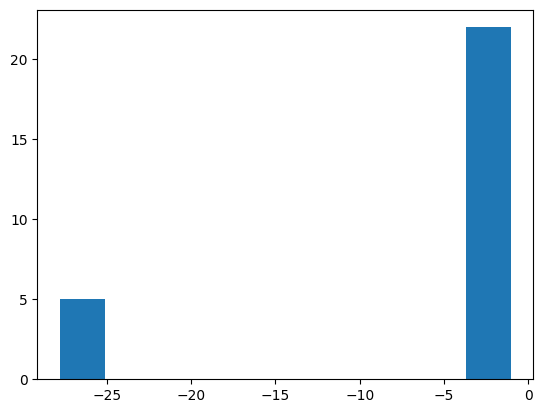

In [39]:
plt.hist(real_df.objective.values)

In [40]:
real_df_cut = real_df#[real_df.objective < 1000.00]

In [41]:
#real_df_cut

In [52]:
# determine categorical and numerical features
numerical_ix = real_df_cut.select_dtypes(include=['int64', 'float64']).columns
categorical_ix = real_df_cut.select_dtypes(include=['object', 'bool']).columns

In [53]:
print(numerical_ix)
print(categorical_ix)

Index(['p0', 'p1', 'objective'], dtype='object')
Index(['p2'], dtype='object')


In [54]:
from sklearn.base import BaseEstimator, TransformerMixin

class IdentityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, input_array, y=None):
        return self
    
    def transform(self, input_array, y=None):
        return input_array*1

In [55]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder, MinMaxScaler, OrdinalEncoder
#!pip install scikit-optimize
import skopt
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsRegressor

In [56]:
t = [('cat', OrdinalEncoder(), categorical_ix), ('num', IdentityTransformer(), numerical_ix)]
data_pipeline = ColumnTransformer(transformers=t)

In [57]:
data_pipeline_model = data_pipeline.fit(real_df_cut)

In [58]:
preprocessed_data = data_pipeline_model.transform(real_df_cut)

In [59]:
preprocessed_data.shape

(27, 4)

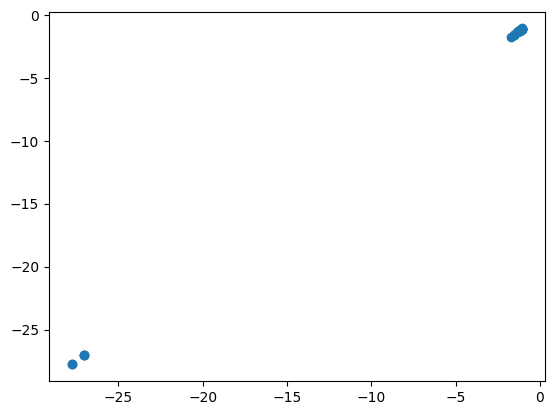

In [61]:
plt.scatter(preprocessed_data[:,3],real_df_cut['objective'].values)

In [62]:
#preprocessed_data[:,4]

In [63]:
regr = RandomForestRegressor()
#regr.fit(preprocessed_data[:,1:],preprocessed_data[:,0])

In [64]:
from sklearn.model_selection import cross_val_score

In [66]:
cv_scores = cross_val_score(regr, preprocessed_data[:,0:3],preprocessed_data[:,3], cv=10)

In [67]:
preprocessed_data.shape

(27, 4)

In [68]:
print(cv_scores)

[  -0.44806194    0.60181409    0.99955906   -0.54129778   -1.01707987
    0.29964557   -0.68054112   -2.64436041   -0.10943471 -102.43264228]


In [70]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(preprocessed_data[:,0:3], preprocessed_data[:,3], test_size=0.50, 
                                                    random_state=42)

In [71]:
X_train.shape

(13, 3)

In [72]:
regr.fit(X_train,y_train)

RandomForestRegressor()

0.7583664774243257


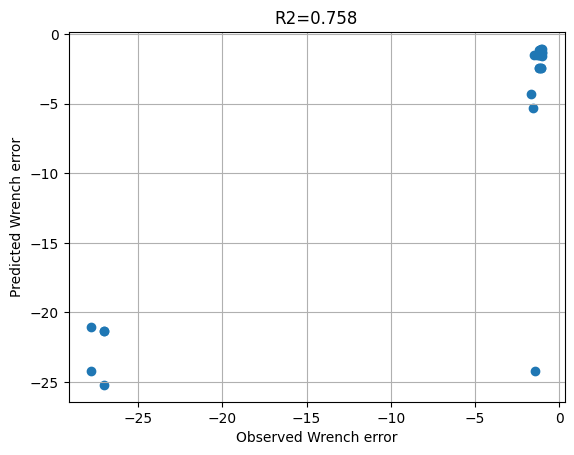

In [73]:
preds = regr.predict(preprocessed_data[:,0:3])
plt.scatter(preprocessed_data[:,3],preds)
r2 = r2_score(preprocessed_data[:,3],preds)
print(r2)
plt.ylabel('Predicted Wrench error')
plt.xlabel('Observed Wrench error')
#plt.suptitle('Wrench simulation error prediction')
plt.title('R2=%1.3f'%r2)
plt.grid()

In [74]:
input_names = real_df_cut.columns.to_list()[:-1]

In [75]:
sorted_idx = regr.feature_importances_.argsort()

In [76]:
print(sorted_idx)
print(input_names)

[1 2 0]
['p0', 'p1', 'p2']


In [77]:
input_names_new = []
for inp in input_names:
    k = inp
    input_names_new.append(k)

In [78]:
input_names = input_names_new

In [79]:
import shap

In [82]:
explainer = shap.TreeExplainer(regr)
shap_values = explainer.shap_values(preprocessed_data[:,0:3])

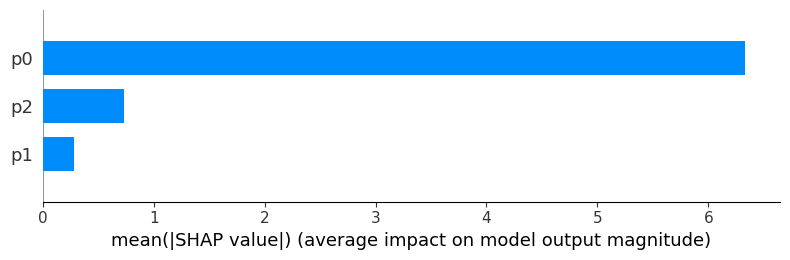

In [83]:
shap.summary_plot(shap_values, feature_names = input_names, plot_type="bar")

In [84]:
X_test1 = pd.DataFrame(preprocessed_data[:,0:3])
X_test1.columns = input_names

In [85]:
#print(X_test1)

In [87]:
import random
random_indices = random.sample(range(X_test1.shape[0]),25)

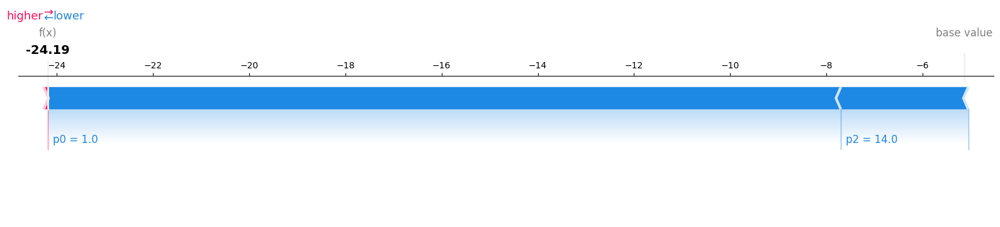

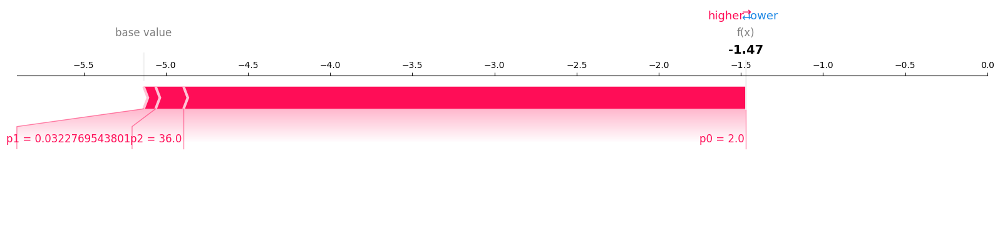

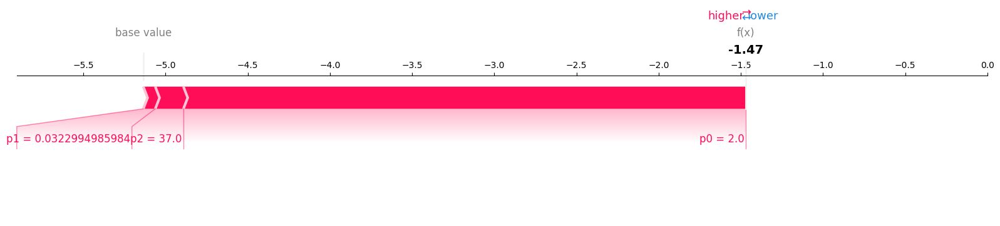

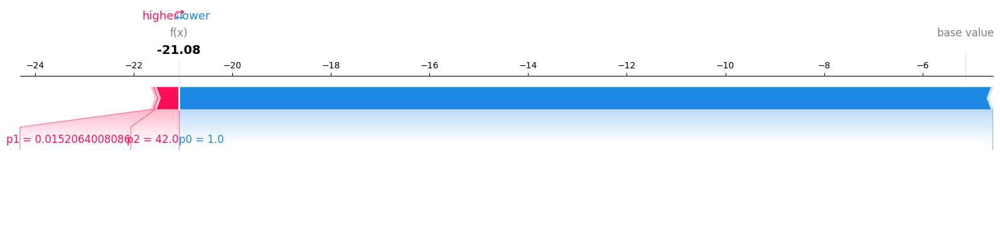

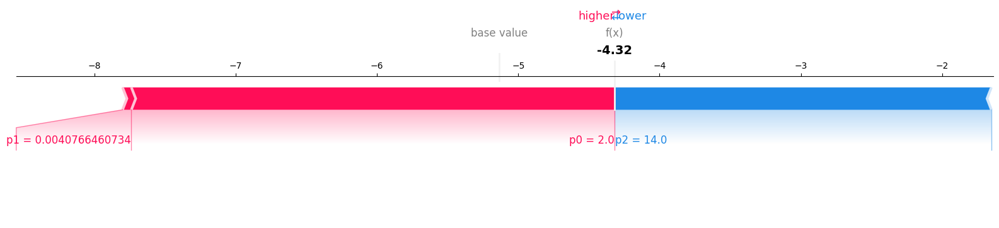

...

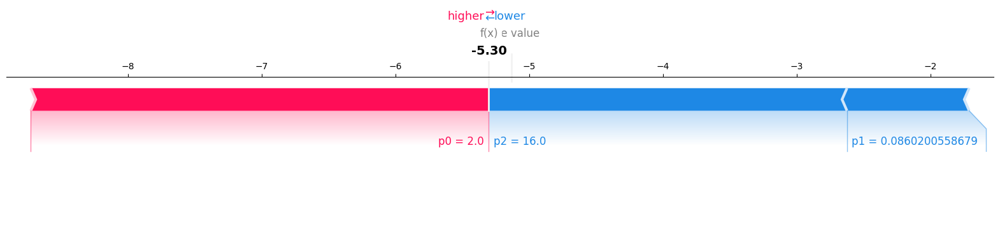

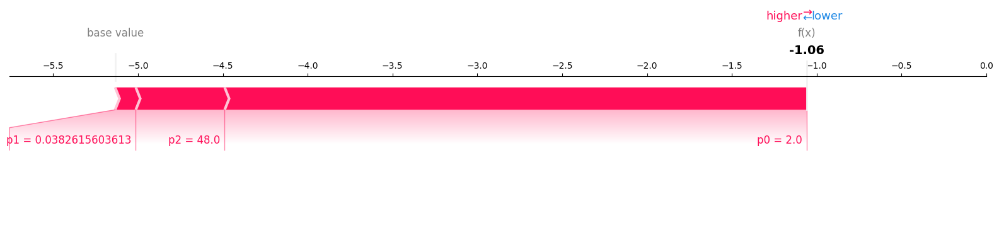

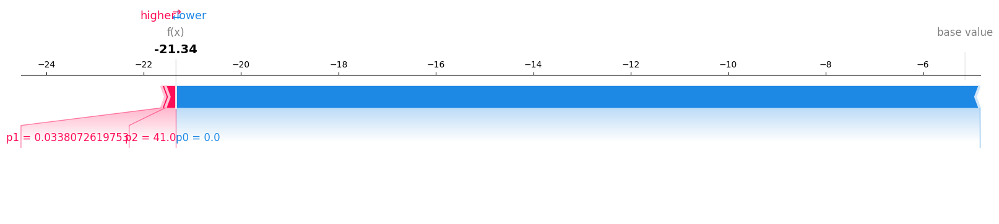

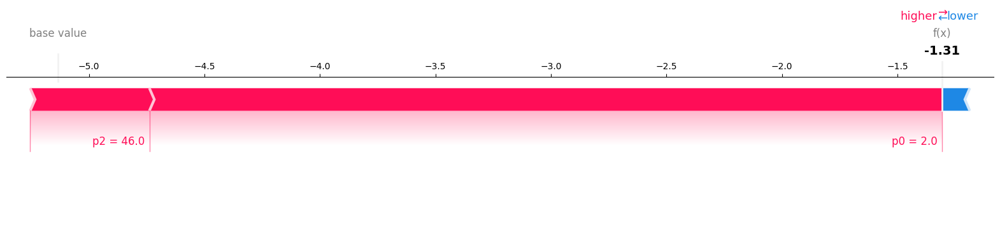

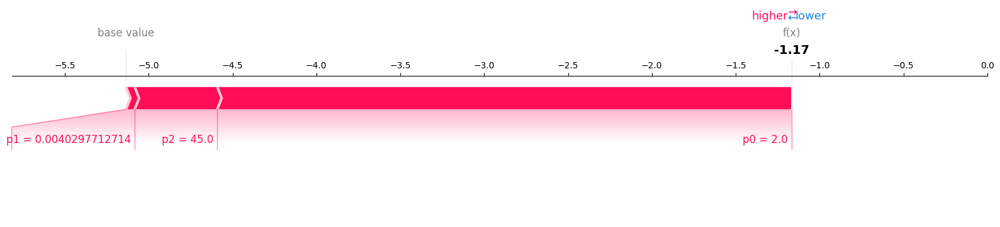

In [88]:
for i in random_indices: 
    choosen_instance = X_test1.loc[[i]]
    shap_values = explainer.shap_values(choosen_instance)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values, choosen_instance,matplotlib=True)